# Preprocessing fNIRS Data Example

These are my notes for a tutorial on preprocessing given in the MNE docs, as well as the Webinar on fNIRS given at NIRx, which is excellent for getting acquainted with MNE. mne offers source estimation, machine learning tools, encoding and decoding tools, connectivity and data vis for analyzing human neurophysiological data. Here we apply it to functional Near Infared Spectroscopy (fNIRS) data from one subject's motor cortex. The majority of the code below is under the below copyright:

In [ ]:
# Authors: Robert Luke <mail@robertluke.net>
#
# License: BSD (3-clause)

In [1]:
import os
import os.path as op
import numpy as np
import matplotlib.pyplot as plt
import pyvista
import pyvistaqt
import PyQt5
import mne
import mne_nirs

%matplotlib inline




The data is loaded in NIRx format, and is located in your home directory under the directory name "mne_data". It has three conditions:



   * tapping the left thumb to fingers

   * tapping the right thumb to fingers

   * a control where nothing happens

The tapping lasts 5 seconds, and there are 30 trials of each condition.

In [2]:
fnirs_data_folder = mne.datasets.fnirs_motor.data_path()
fnirs_cw_amplitude_dir = os.path.join(fnirs_data_folder, 'Participant-1')
raw_intensity = mne.io.read_raw_nirx(fnirs_cw_amplitude_dir, verbose=True)
raw_intensity.load_data()


Loading /Users/del/mne_data/MNE-fNIRS-motor-data/Participant-1
Reading 0 ... 23238  =      0.000 ...  2974.464 secs...


<RawNIRX | Participant-1, 56 x 23239 (2974.5 s), ~10.0 MB, data loaded>

Loading the data displays the output of .info on the dataset. We see that all channels are good and there are 56 of them. The duration of the sampling is 49 minutes and 34.464 seconds, or:

In [3]:
60 * 49 + 34.464

2974.464

Because the sampling rate is 7.81 hz, the number of frames (samples) is approximately:

In [4]:
7.81 * 2974.464

23230.56384

We see that there are actually 23238 samples in the dataset. A lowpass filter is applied to the dataset, cutting out all frequencies above 3.91 hz. 

For more info on the subject we can use the subject info key: 



In [5]:
raw_intensity.info['subject_info']

{'his_id': 'P1',
 'first_name': 'P1',
 'sex': 1 (FIFFV_SUBJ_SEX_MALE),
 'birthday': (1985, 11, 2)}

Let's do some housekeeping. We'll remove the code set as an annotation for the start and end of the experiment (15.0) and we'll rename the codes for the control and tapping conditions to be more clear. We'll also set the duration of the events (5). 

In [6]:
raw_intensity.annotations.set_durations(5)
raw_intensity.annotations.rename({'1.0': 'Control',
                                  '2.0': 'Tapping/Left',
                                  '3.0': 'Tapping/Right'})
unwanted = np.nonzero(raw_intensity.annotations.description == '15.0')
raw_intensity.annotations.delete(unwanted)

## Visualization

The below code will take a hot second to execute because it utilizes the pyvistaqt backend for 3d visualization. From the tutorial: "Source-detector pairs here are shown as lines between the optodes, channels (the mid point of source-detector pairs) are optionally shown as orange dots. Source are optionally shown as red dots and detectors as black."

In [7]:
mne.viz.set_3d_backend('pyvistaqt', verbose=None)
subjects_dir = op.join(mne.datasets.sample.data_path(), 'subjects')

brain = mne.viz.Brain(
    'fsaverage', subjects_dir=subjects_dir, background='w', cortex='0.5')
brain.add_sensors(
    raw_intensity.info, trans='fsaverage',
    fnirs=['channels', 'pairs', 'sources', 'detectors'])
brain.show_view(azimuth=20, elevation=60, distance=400)

Using pyvistaqt 3d backend.

Channel types::	fnirs_cw_amplitude: 56


Now for the fun part, let's plot all the channels using the plot function: 

Using matplotlib as 2D backend.


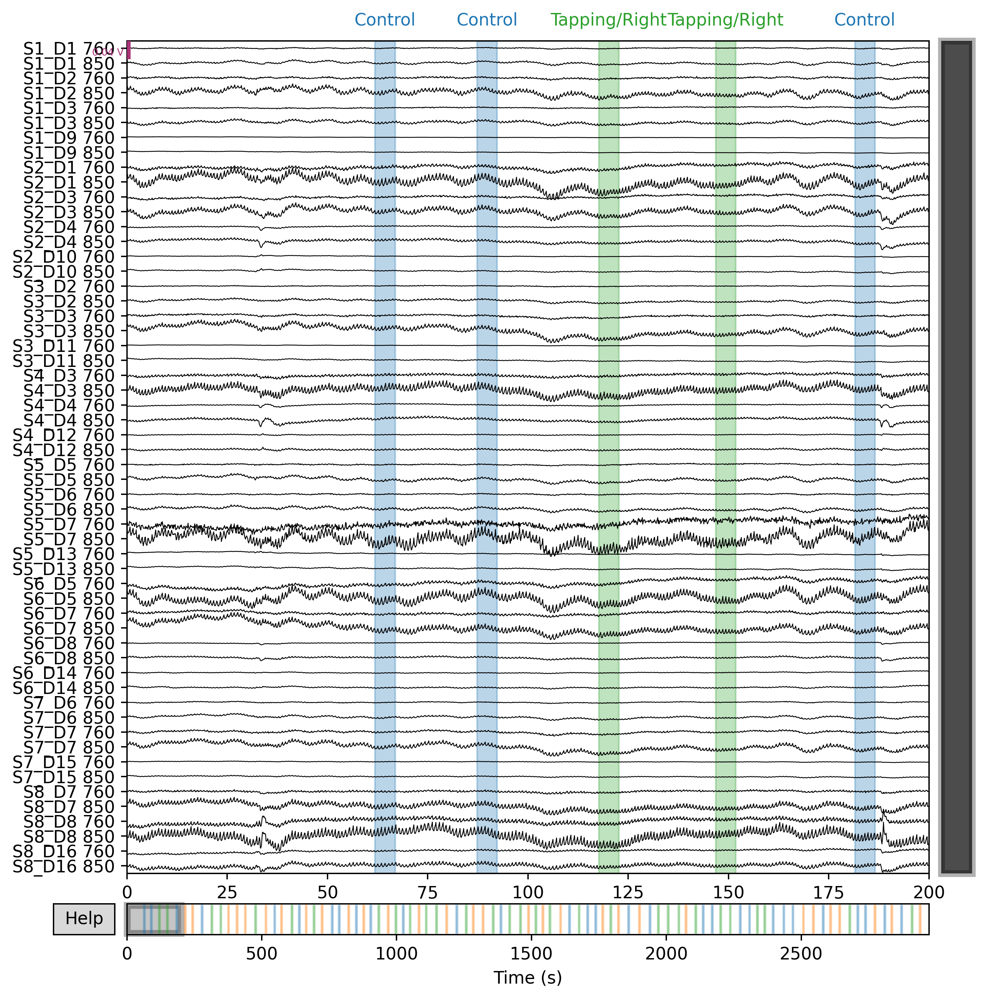

In [8]:
# makes plot interactive V
# %matplotlib qt 

plt.rcParams['figure.dpi'] = (350)

raw_intensity.plot(duration=200, n_channels=56)
plt.close()

We can also zero in on just a few channels to visualize. To see the first four channels (note that you must copy the original data object as this will modify it to remove all other channels).:

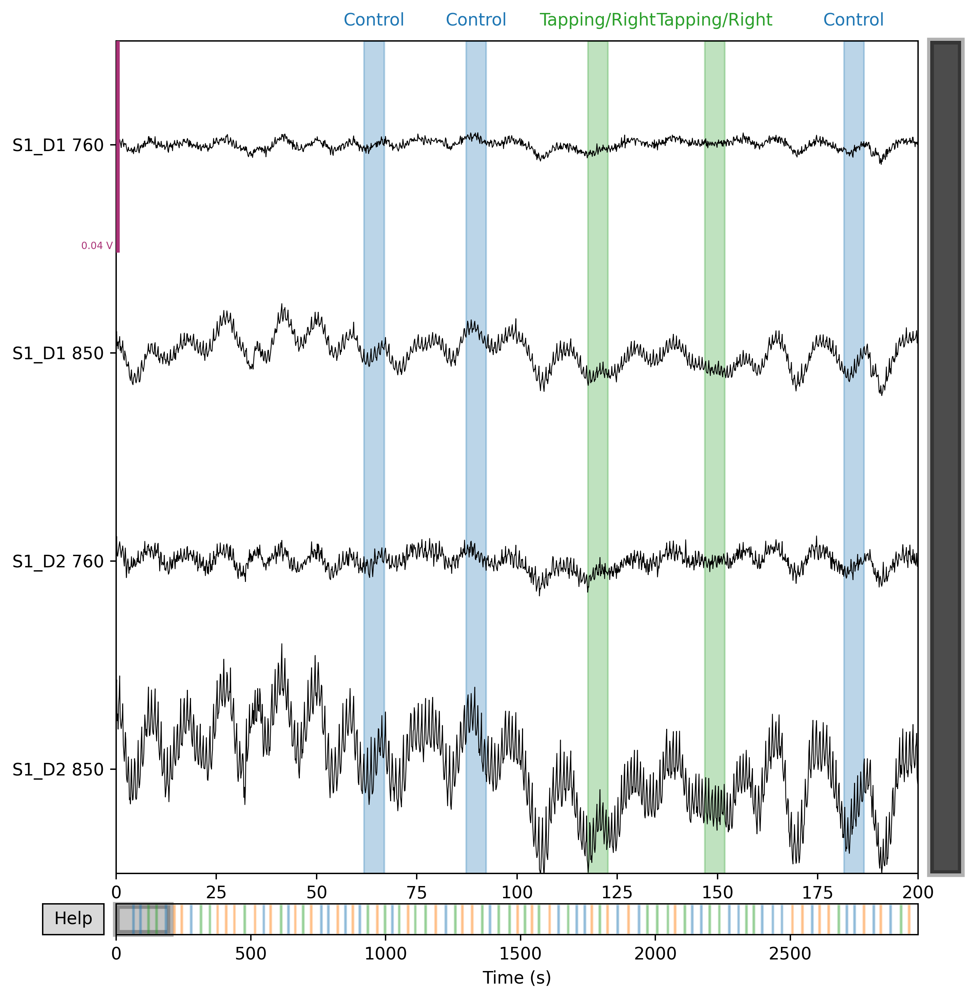

In [9]:
raw_intensity.copy().pick(picks=[0,1,2,3]).plot(duration=200)
plt.close()

We can also plot the event triggers which would help with analyzing the raw data:

In [10]:
events, event_dict = mne.events_from_annotations(raw_intensity, verbose=False)

Note that if we didn't rename the annotations earlier, we would have to assign them here to a dict. 

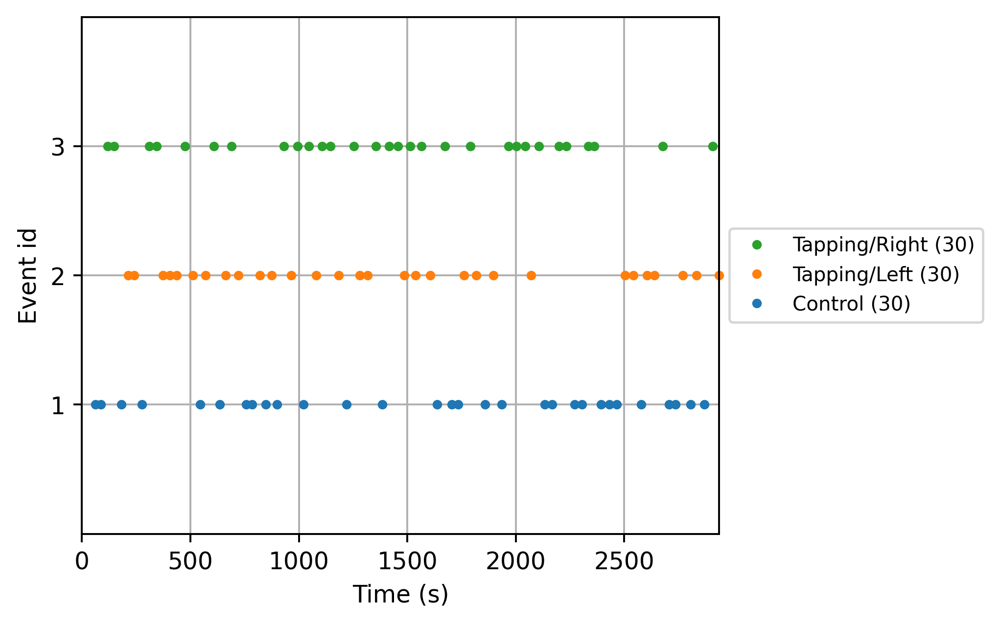

In [11]:
mne.viz.plot_events(events, event_id= event_dict, sfreq= raw_intensity.info['sfreq'])
plt.close()

We can also get the power spectral density for the traces:

Effective window size : 262.144 (s)


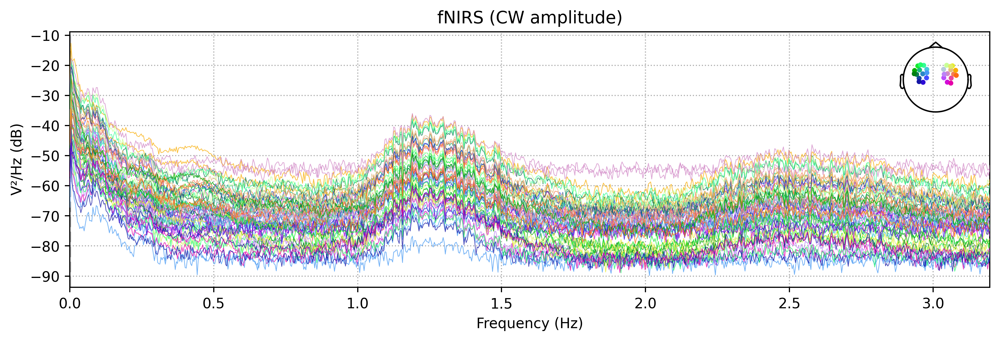

In [12]:
raw_intensity.plot_psd(fmax=3.2)
plt.close()

We can plot the sensors as below: 

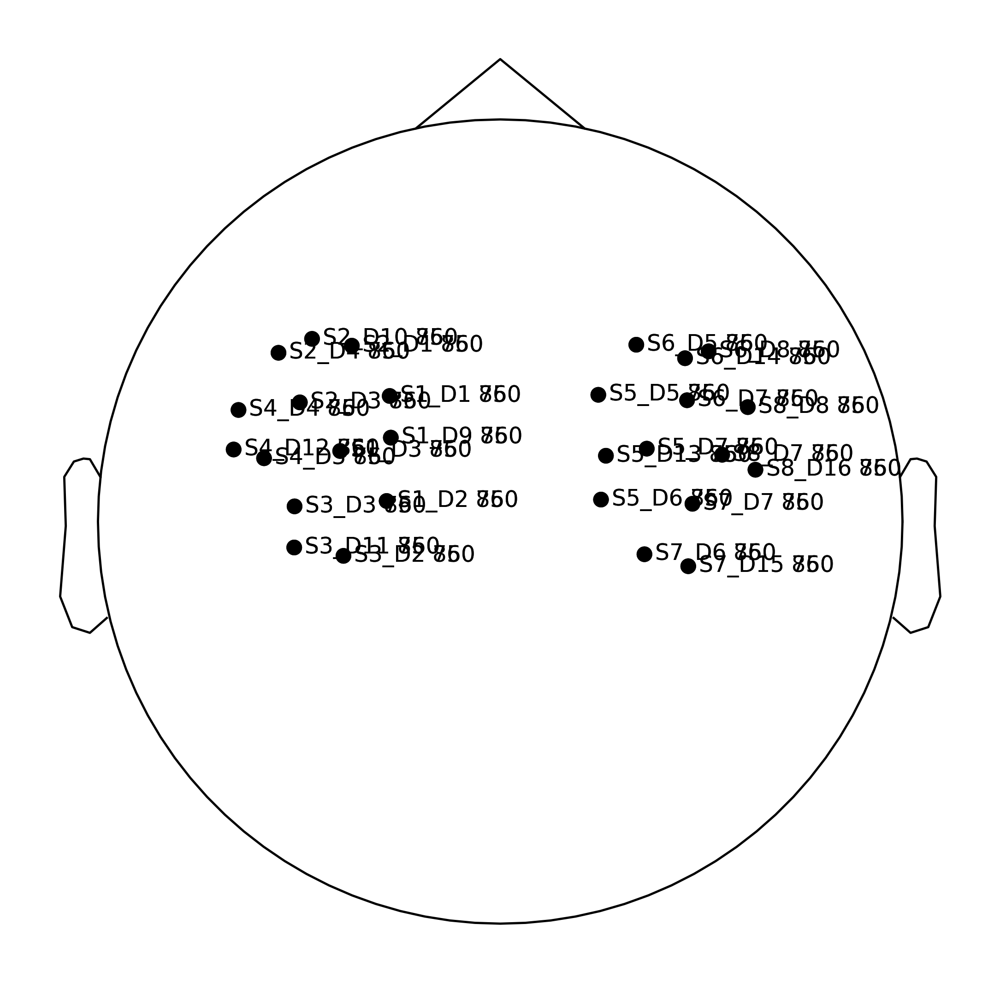

In [13]:
raw_intensity.plot_sensors(show_names=True)
plt.close()

To select just a few key sensors, create a utility function:

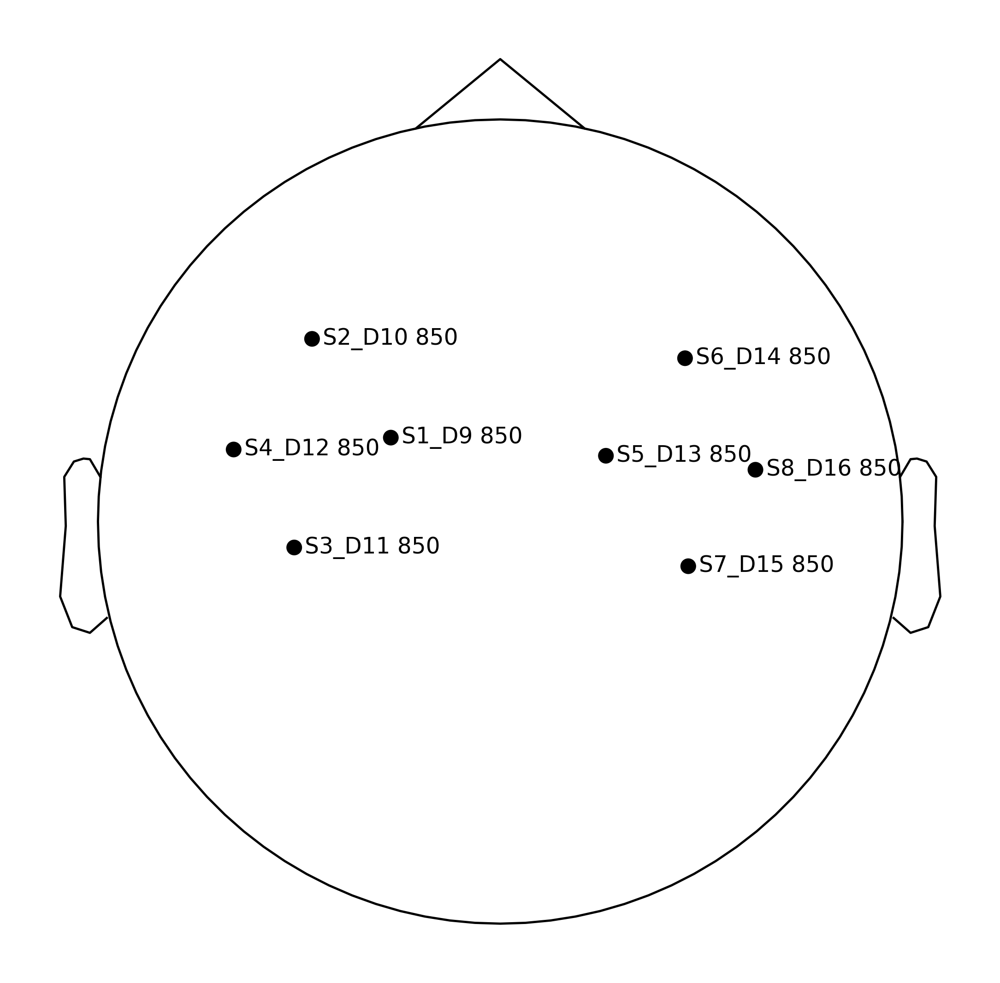

In [14]:
def select_sens_by_group(sensors): 
    sensor_groups = {}
    for sensor in sensors: 
        split_sensor = sensor.split('_')
        sensor_freq = int (split_sensor[-1].split(' ')[1])
#        We only want the sensors with num 850
        if sensor_freq != 850:
            continue
#       If our sensor name is S1_D1 760, our sensor group is S1. 
        sensor_group = split_sensor[0]
        
#       Assign the first sensor we find in this group to represent the entire group
        sensor_groups[sensor_group] = sensor
    return sensor_groups.values()

sensor_picks = select_sens_by_group(raw_intensity.info.ch_names)
raw_intensity.copy().pick(picks=list(sensor_picks)).plot_sensors(show_names=True)
plt.close()


## Signal Processing

MNE has many built in tools for signal processing, such as a converter to optical density: 

In [15]:
raw_od = mne.preprocessing.nirs.optical_density(raw_intensity)

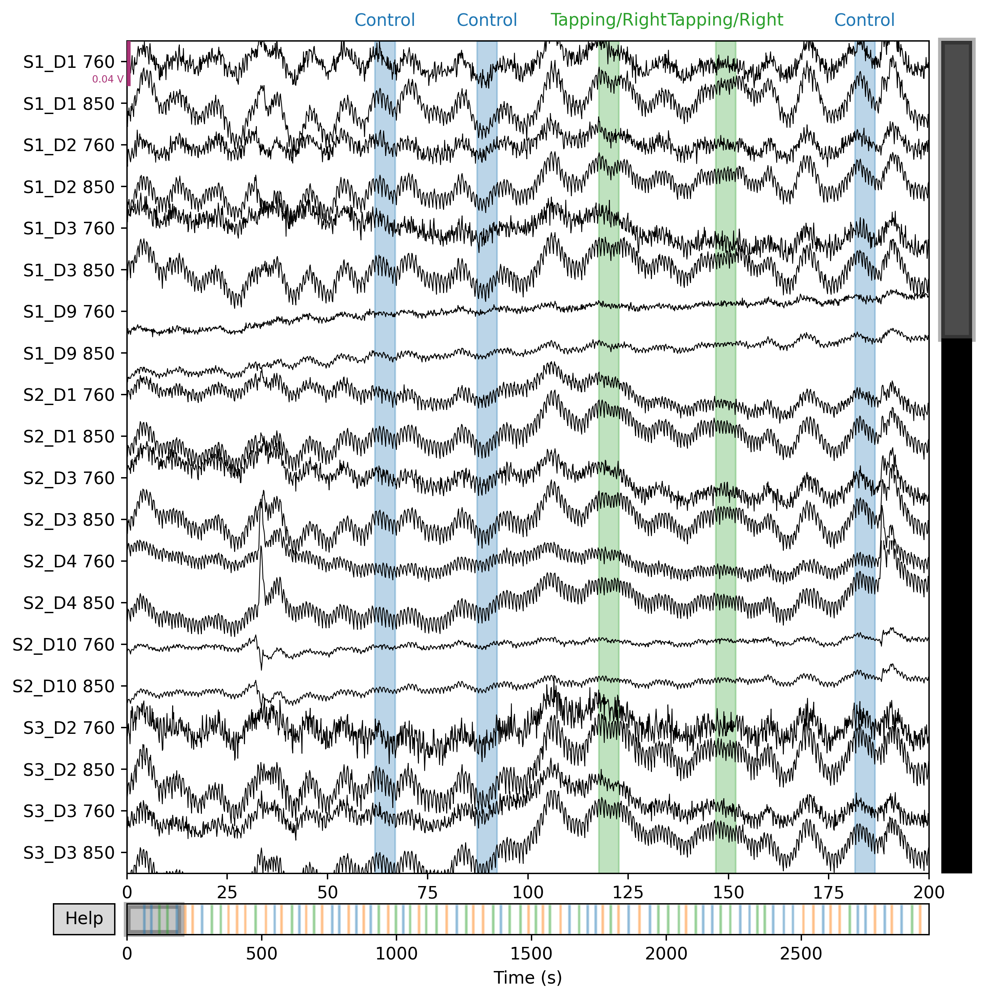

In [16]:
raw_od.plot(duration=200)
plt.close()

We can use the Beer Lambert law converter to get hemoglobin concentrations from our optical density:

In [17]:
from mne.preprocessing.nirs import beer_lambert_law, optical_density
raw_hemo = beer_lambert_law(raw_od, ppf=.1)

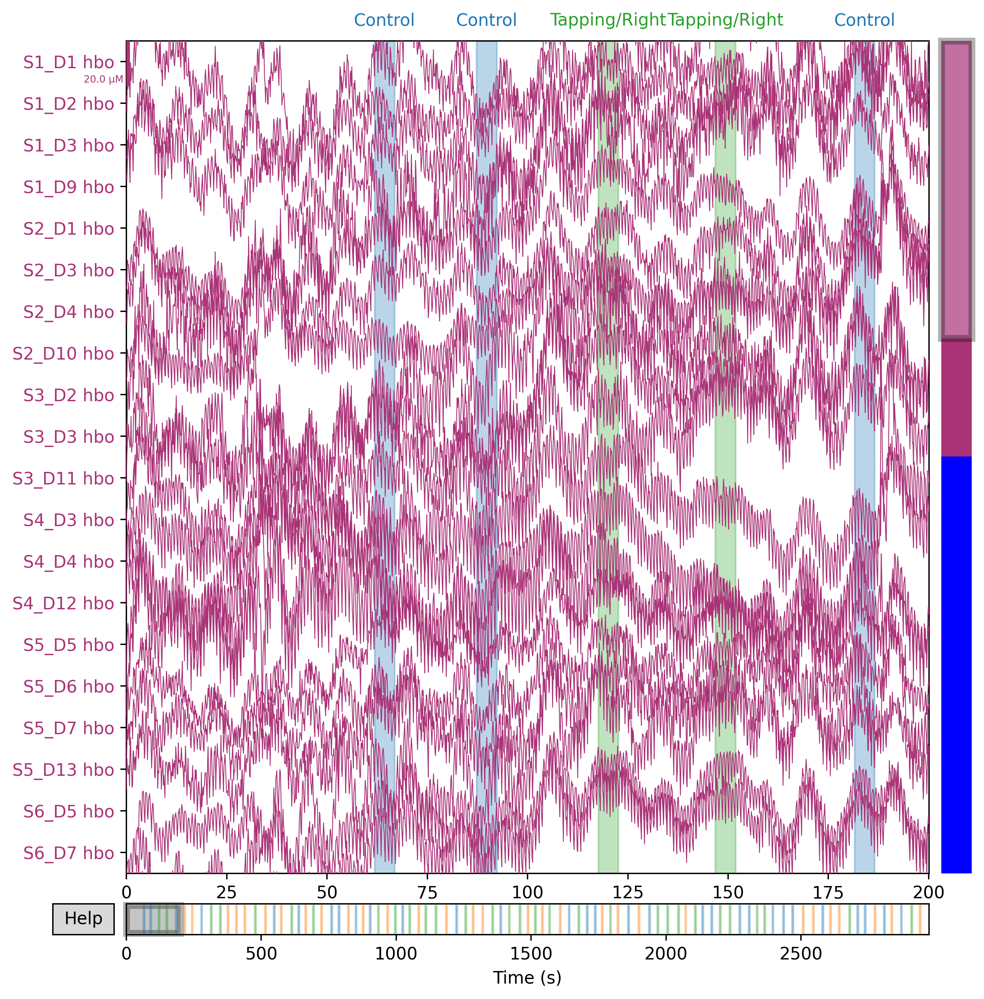

In [18]:
raw_hemo.plot(duration = 200, clipping= None)
plt.close()

We can set the scaling with the `scaling` argument to make things more comparable. 


## Data Quality 

The scalp coupling index lets us determine the presence of cardiac physiological signals, which tells us how well our sensors are coupled to the scalp and how likely we are to get brain responses. Our quality is quite good (if you got an SCI less than .5, you can mark that channel as bad). 

[Text(0.5, 0, 'Scalp Coupling Index'), Text(0, 0.5, 'Count'), (0.0, 1.0)]

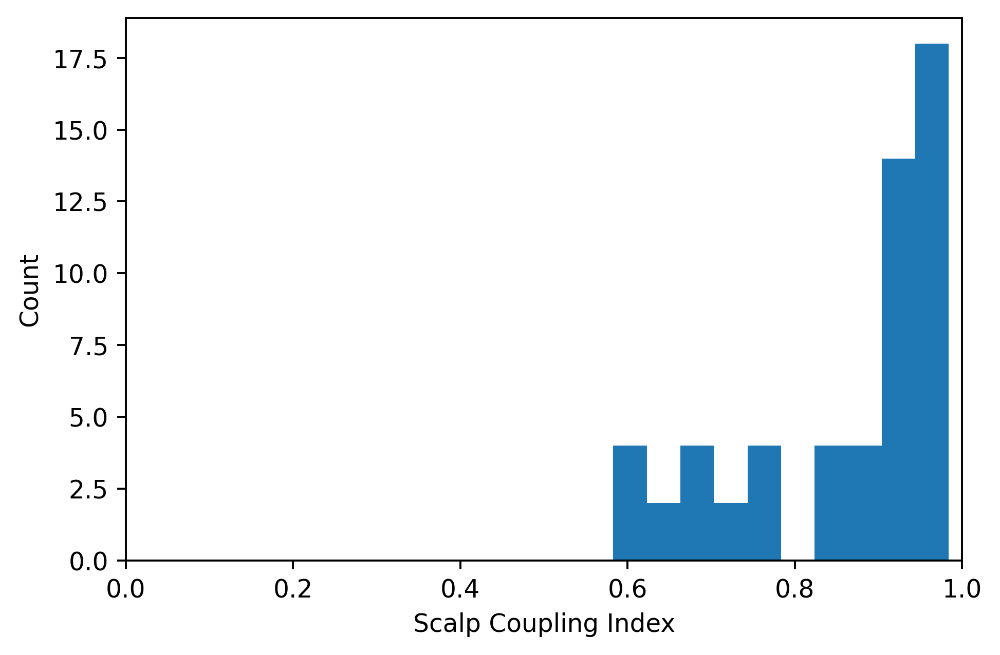

In [19]:
sci = mne.preprocessing.nirs.scalp_coupling_index(raw_od)
fig, ax = plt.subplots()
ax.hist(sci)
ax.set(xlabel='Scalp Coupling Index', ylabel='Count', xlim=[0, 1])

# Removing Heart Rate From Signal

Heart rate signals emerge above the 1 hz threshold of hemodynamic response, whereas brain signals typically emerge under .5 hz. We can filter using a band pass or a lowpass

Effective window size : 262.144 (s)
Effective window size : 262.144 (s)


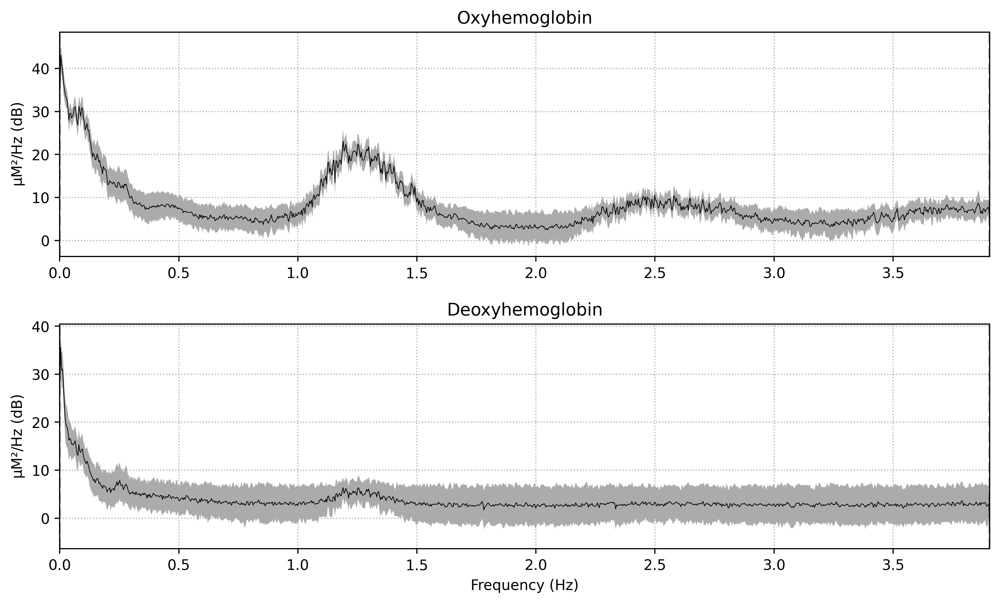

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.05 - 0.7 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.05
- Lower transition bandwidth: 0.02 Hz (-6 dB cutoff frequency: 0.04 Hz)
- Upper passband edge: 0.70 Hz
- Upper transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.80 Hz)
- Filter length: 1291 samples (165.248 sec)

Effective window size : 262.144 (s)
Effective window size : 262.144 (s)


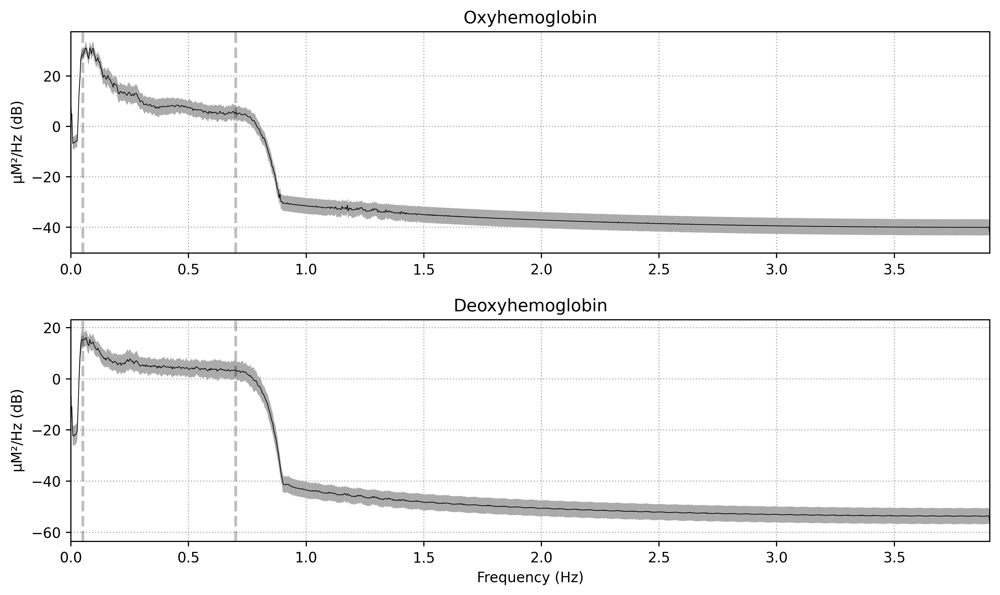

In [20]:
fig = raw_hemo.plot_psd(average=True)
fig.suptitle('Before filtering', weight='bold', size='x-large')
fig.subplots_adjust(top=0.88)
raw_hemo = raw_hemo.filter(0.05, 0.7, h_trans_bandwidth=0.2,
                             l_trans_bandwidth=0.02)
fig = raw_hemo.plot_psd(average=True)
fig.suptitle('After filtering', weight='bold', size='x-large')
fig.subplots_adjust(top=0.88)

## A Waveform Analysis

We'll do a waveform analysis of the hemoglobin concentration data now. First let's only look at a subset of the channels, the long channels:


In [21]:
raw_hemo = mne_nirs.channels.get_long_channels(raw_hemo)

In [22]:
len(raw_hemo.info.ch_names)

40

We can now plot the power spectral density of the hemoglobin concentrations: 

Effective window size : 262.144 (s)
Effective window size : 262.144 (s)


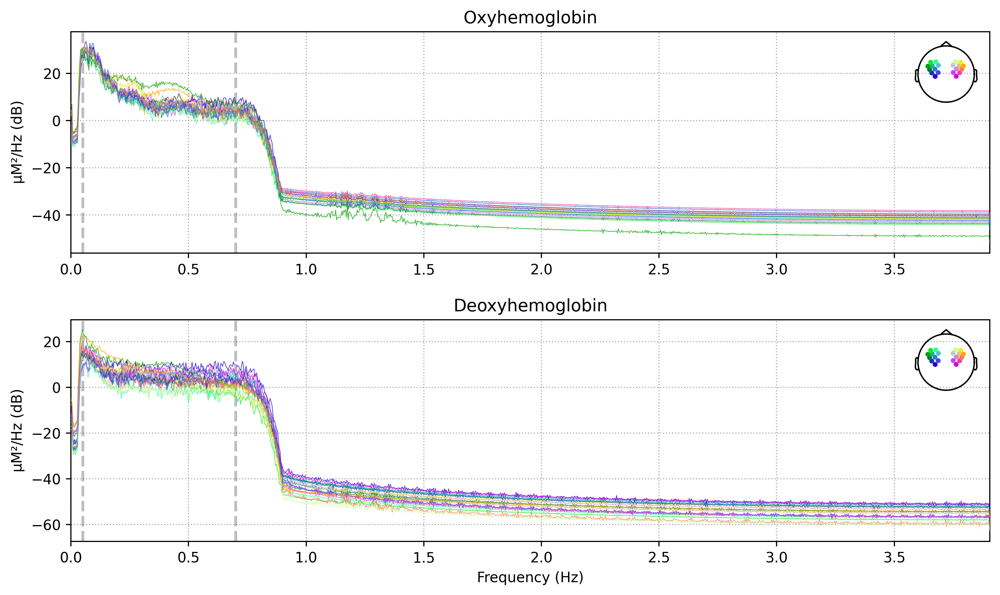

In [23]:
raw_hemo.plot_psd(average=False)
plt.close()

Let's extract the epochs relevant to the experimental conditions. We are rejecting all epochs with a maximum peak to peak amplitude of greater than 80e-5. 


Used Annotations descriptions: ['Control', 'Tapping/Left', 'Tapping/Right']


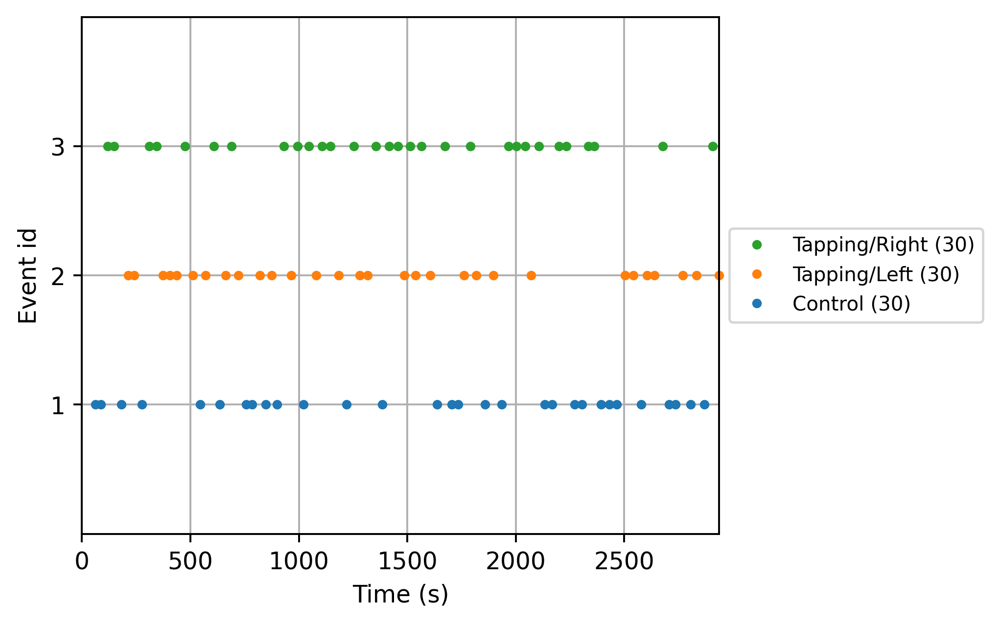

Not setting metadata
Not setting metadata
90 matching events found
Setting baseline interval to [-4.992, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 90 events and 157 original time points ...
0 bad epochs dropped


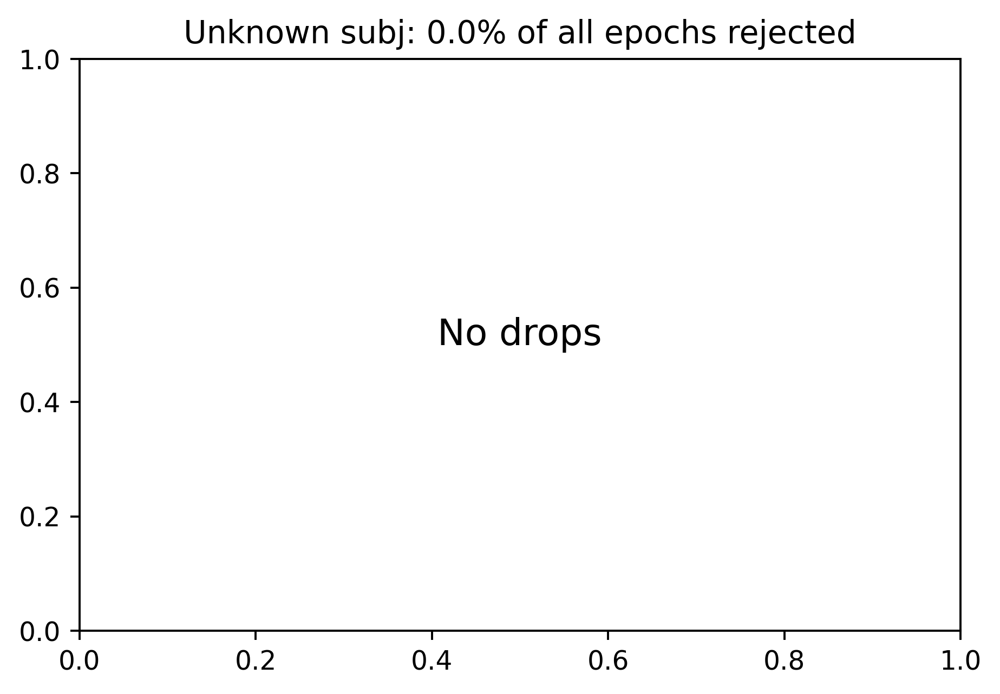

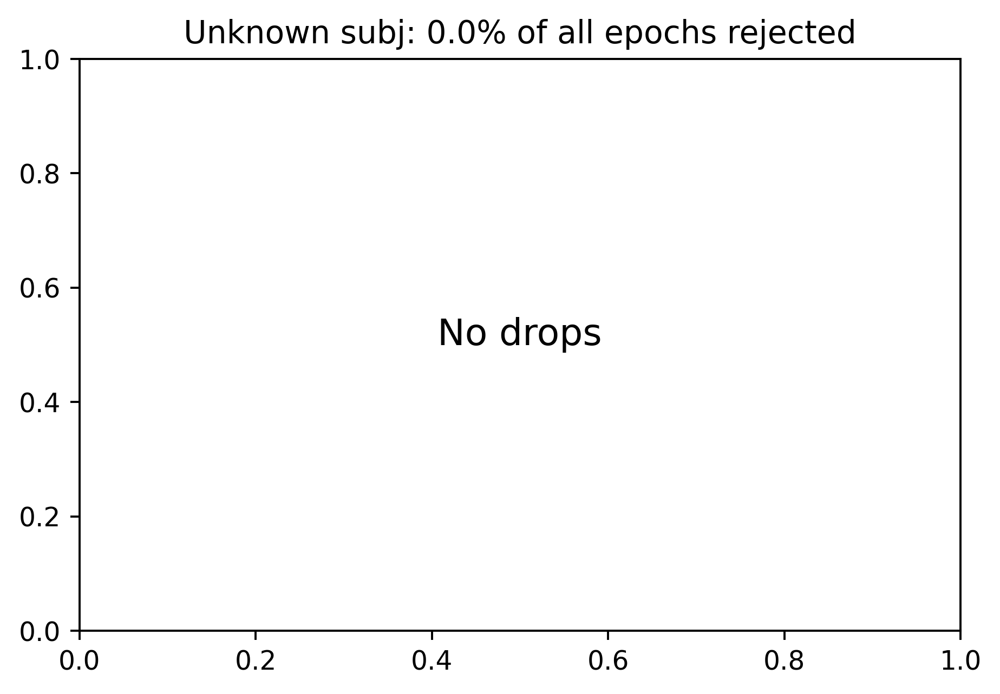

In [24]:
events, event_dict = mne.events_from_annotations(raw_hemo)
fig = mne.viz.plot_events(events, event_id=event_dict,
                          sfreq=raw_hemo.info['sfreq'])
fig.subplots_adjust(right=0.7)  # make room for the legend


reject_criteria = dict(hbo=80e-5)
tmin, tmax = -5, 15

epochs = mne.Epochs(raw_hemo, events, event_id=event_dict,
                    tmin=tmin, tmax=tmax,
                    reject=reject_criteria, reject_by_annotation=True,
                    proj=True, baseline=(None, 0), preload=True,
                    detrend=None, verbose=True)
epochs.plot_drop_log()

We can see that we don't actually need to drop any epochs, which means we should probably change our rejection criteria. Let's leave it as is for now. 

To visualize consistency of the hemodynamic response of the tapping, let's visualize all the responses, note that the convention of subclassing conditions e.g. "Tapping/Left" allows us to get all the relevant conditions from the epochs dictionary.: 

Not setting metadata
Not setting metadata
60 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
60 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


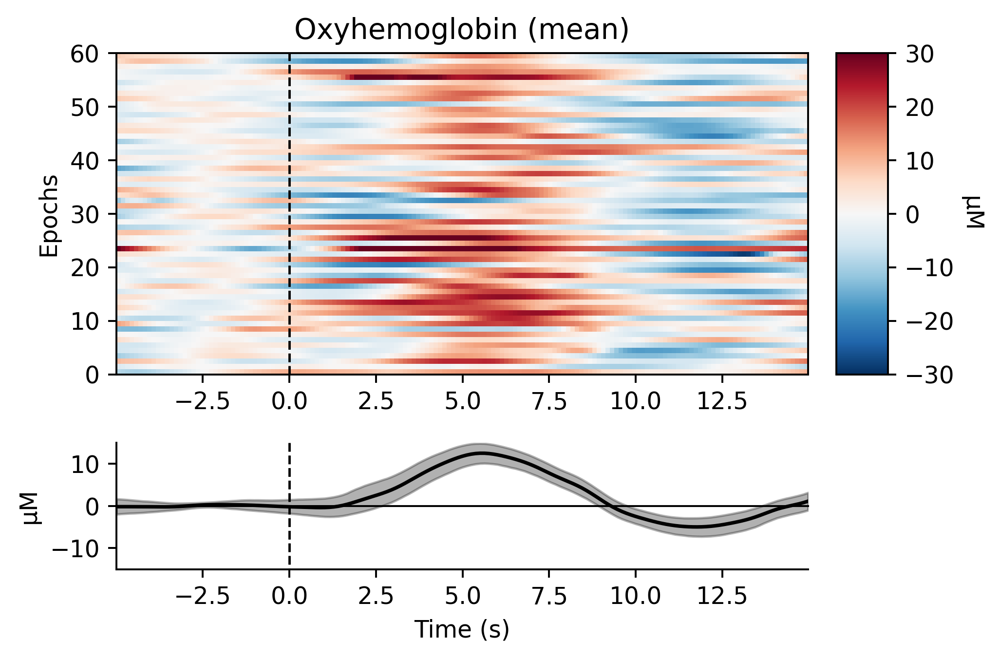

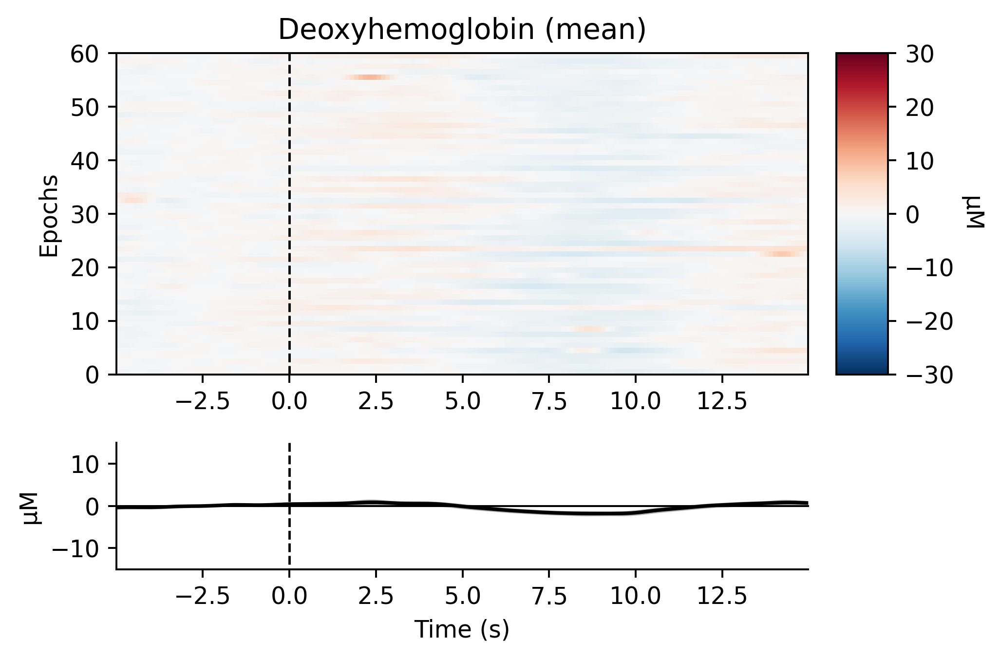

[<Figure size 2100x1400 with 3 Axes>, <Figure size 2100x1400 with 3 Axes>]

In [25]:
epochs['Tapping'].plot_image(combine='mean', vmin=-30, vmax=30,
                             ts_args=dict(ylim=dict(hbo=[-15, 15],
                                                    hbr=[-15, 15])))

Let's look at our control conditon: 

Not setting metadata
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
Not setting metadata
Not setting metadata
30 matching events found
No baseline correction applied
0 projection items activated
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


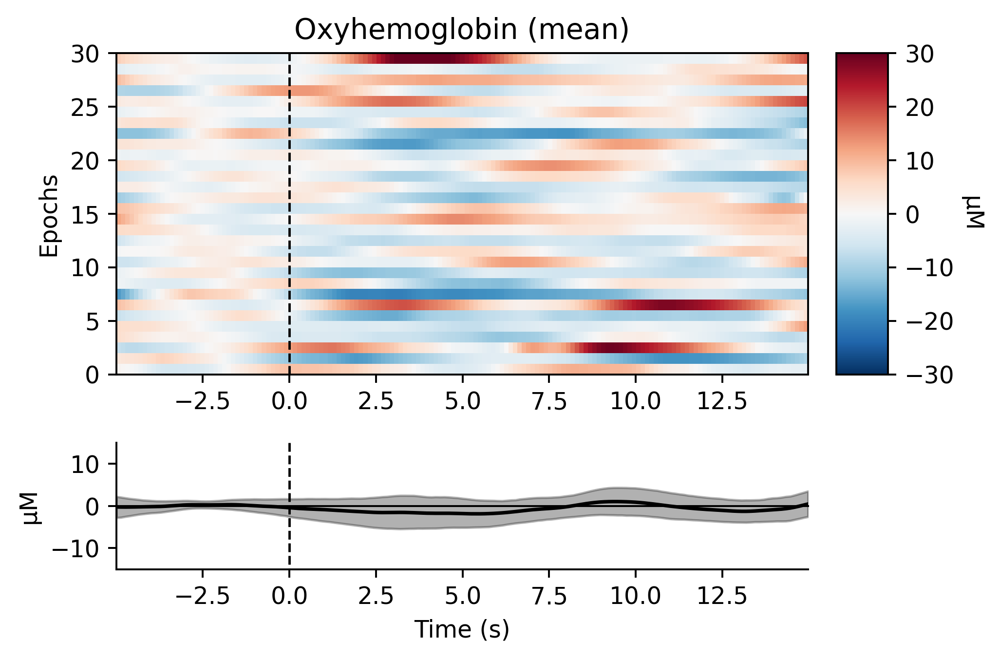

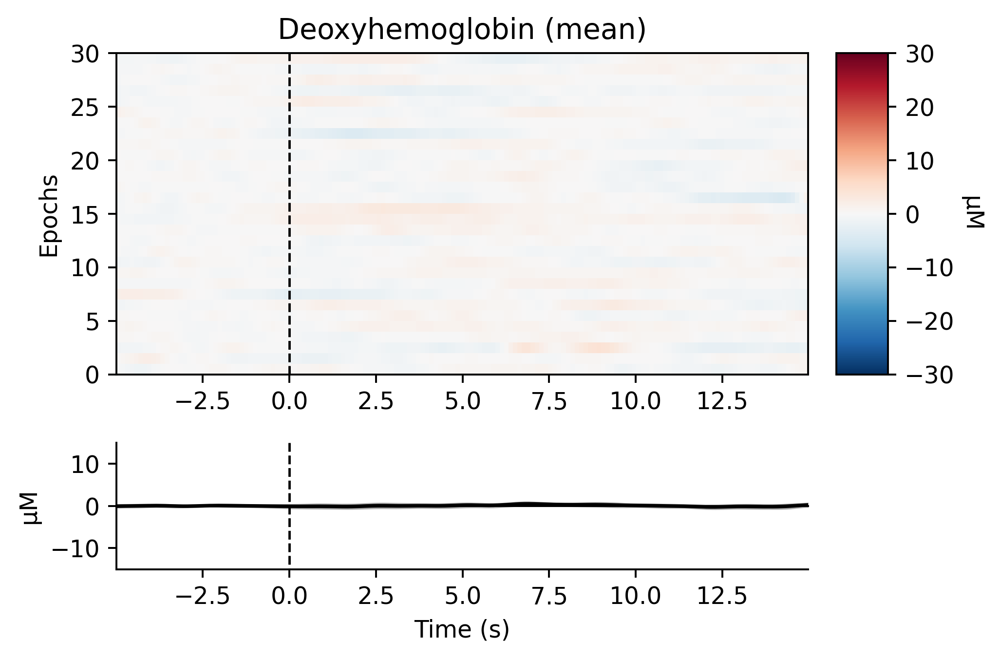

[<Figure size 2100x1400 with 3 Axes>, <Figure size 2100x1400 with 3 Axes>]

In [26]:
epochs['Control'].plot_image(combine='mean', vmin=-30, vmax=30,
                             ts_args=dict(ylim=dict(hbo=[-15, 15],
                                                    hbr=[-15, 15])))

The control appears to have some signal past the 6 second mark. We should investigate that, but we won't return to it for now. 

We can visualize using a topographic map the oxygenated hemoglobin activity for left and right taps at the interval from 4 to 10 seconds.

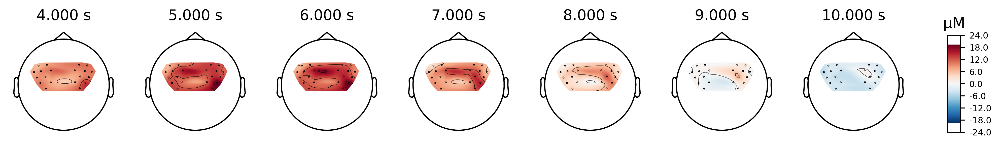

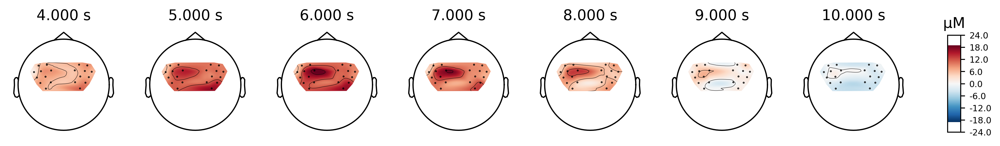

In [29]:
topomap_args = dict(extrapolate='local')

times = np.arange(4.0, 11.0, 1.0)
epochs['Tapping/Left'].average(picks='hbo').plot_topomap(
    times=times, **topomap_args)
epochs['Tapping/Right'].average(picks='hbo').plot_topomap(
    times=times, **topomap_args)
plt.close()

We can also look at a single timepoint and compare the deoxygenated and oxygenated responses more closely. 

In [35]:
%matplotlib qt
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(9, 5),
                         gridspec_kw=dict(width_ratios=[1, 1, 1, 0.1]))
vmin, vmax, ts = -8, 8, 9.0

evoked_left = epochs['Tapping/Left'].average()
evoked_right = epochs['Tapping/Right'].average()

evoked_left.plot_topomap(ch_type='hbo', times=ts, axes=axes[0, 0],
                         vmin=vmin, vmax=vmax, colorbar=False,
                         **topomap_args)
evoked_left.plot_topomap(ch_type='hbr', times=ts, axes=axes[1, 0],
                         vmin=vmin, vmax=vmax, colorbar=False,
                         **topomap_args)
evoked_right.plot_topomap(ch_type='hbo', times=ts, axes=axes[0, 1],
                          vmin=vmin, vmax=vmax, colorbar=False,
                          **topomap_args)
evoked_right.plot_topomap(ch_type='hbr', times=ts, axes=axes[1, 1],
                          vmin=vmin, vmax=vmax, colorbar=False,
                          **topomap_args)

evoked_diff = mne.combine_evoked([evoked_left, evoked_right], weights=[1, -1])

evoked_diff.plot_topomap(ch_type='hbo', times=ts, axes=axes[0, 2:],
                         vmin=vmin, vmax=vmax, colorbar=True,
                         **topomap_args)
evoked_diff.plot_topomap(ch_type='hbr', times=ts, axes=axes[1, 2:],
                         vmin=vmin, vmax=vmax, colorbar=True,
                         **topomap_args)

for column, condition in enumerate(
        ['Tapping Left', 'Tapping Right', 'Left-Right']):
    for row, chroma in enumerate(['HbO', 'HbR']):
        axes[row, column].set_title('{}: {}'.format(chroma, condition))
fig.tight_layout()
fig.show()

Finally we can observe the waveforms driving the figure above. 

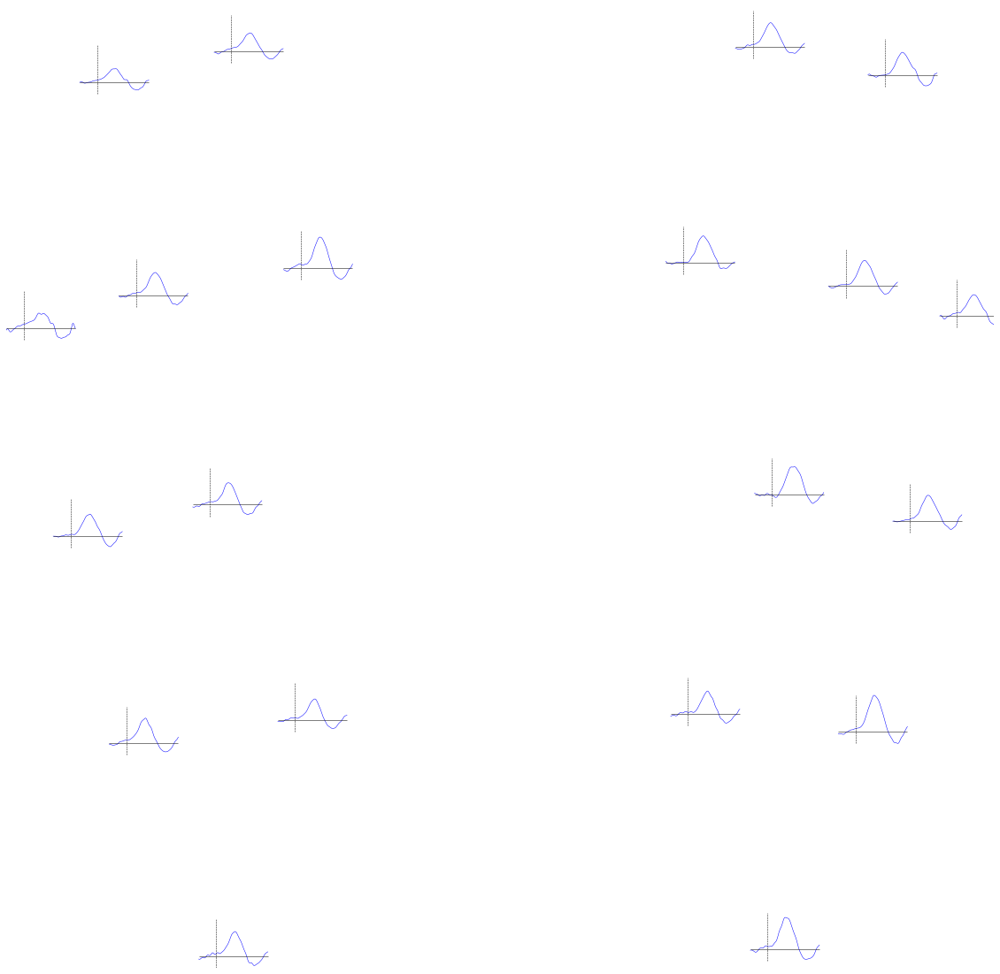

In [39]:
%matplotlib inline

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
mne.viz.plot_evoked_topo(epochs['Left'].average(picks='hbo'), color='b',
                         axes=axes, legend=False)
mne.viz.plot_evoked_topo(epochs['Right'].average(picks='hbo'), color='r',
                         axes=axes, legend=False)

# Tidy the legend.
leg_lines = [line for line in axes.lines if line.get_c() == 'b'][:1]
leg_lines.append([line for line in axes.lines if line.get_c() == 'r'][0])
fig.legend(leg_lines, ['Left', 'Right'], loc='lower right')
